In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date, datetime, timedelta

In [2]:
df_gbg = pd.read_csv('../data/avg_daily_temp_GBG.csv', parse_dates=['Datum'])

In [3]:
df_gbg.dtypes

Datum             datetime64[ns]
Kvalitet                  object
Snittemperatur           float64
Month                     object
dtype: object

In [4]:
df_save_raw = pd.read_csv('../data/smhi_temp_data_save.csv', sep=';', usecols=[0, 1, 2, 3], header=6, parse_dates=['Datum'])

In [5]:
df_save_raw.dtypes

Datum             datetime64[ns]
Tid (UTC)                 object
Lufttemperatur           float64
Kvalitet                  object
dtype: object

In [6]:
df_save_raw['Snittemperatur'] = df_save_raw['Lufttemperatur'].groupby(df_save_raw['Datum']).transform('mean').round(2)

In [7]:
df_save_raw = df_save_raw.groupby(df_save_raw['Datum']).max().reset_index()

In [8]:
df_save_raw

,Datum,Tid (UTC),Lufttemperatur,Kvalitet,Snittemperatur
0,1944-01-01,18:00:00,4.2,G,3.20
1,1944-01-02,18:00:00,6.4,G,3.60
2,1944-01-03,18:00:00,3.8,G,2.80
3,1944-01-04,18:00:00,-3.4,G,-4.47
4,1944-01-05,18:00:00,1.8,G,-1.40
...,...,...,...,...,...
22980,2006-12-01,23:00:00,9.3,Y,8.03
22981,2006-12-02,23:00:00,9.5,Y,8.81
22982,2006-12-03,23:00:00,9.4,Y,8.11
22983,2006-12-04,23:00:00,9.3,Y,8.57


In [9]:
df_gbg['Month'] = df_gbg['Datum'].dt.month

In [10]:
df_save = df_save_raw.drop(['Tid (UTC)', 'Lufttemperatur'], axis=1)

In [11]:
df_save['Month'] = df_save['Datum'].dt.month

In [12]:
df_gbg

,Datum,Kvalitet,Snittemperatur,Month
0,1961-01-01,G,1.07,1
1,1961-01-02,G,2.27,1
2,1961-01-03,G,2.27,1
3,1961-01-04,G,2.53,1
4,1961-01-05,G,2.13,1
...,...,...,...,...
19909,2023-06-27,G,18.18,6
19910,2023-06-28,G,19.72,6
19911,2023-06-29,G,19.22,6
19912,2023-06-30,G,17.40,6


In [13]:
df_save

,Datum,Kvalitet,Snittemperatur,Month
0,1944-01-01,G,3.20,1
1,1944-01-02,G,3.60,1
2,1944-01-03,G,2.80,1
3,1944-01-04,G,-4.47,1
4,1944-01-05,G,-1.40,1
...,...,...,...,...
22980,2006-12-01,Y,8.03,12
22981,2006-12-02,Y,8.81,12
22982,2006-12-03,Y,8.11,12
22983,2006-12-04,Y,8.57,12


In [14]:
# Add quarter column to df_gbg
df_gbg['Quarter'] = 0
for ind, val in df_gbg.iterrows():
    month = val['Month']
    if 1 <= month <=3:
        df_gbg['Quarter'][ind] = 1
        pass
    elif 4 <= month <= 6:
        df_gbg['Quarter'][ind] = 2
        pass
    elif 7 <= month <= 9:
        df_gbg['Quarter'][ind] = 3
        pass
    else:
        df_gbg['Quarter'][ind] = 4

C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppData

In [15]:
df_save['Quarter'] = df_save['Month']

In [16]:
# Add quarter column to df_save

for ind, val in df_save.iterrows():
    month = val['Month']
    if 1 <= month <=3:
        df_save['Quarter'][ind] = 1
        pass
    elif 4 <= month <= 6:
        df_save['Quarter'][ind] = 2
        pass
    elif 7 <= month <= 9:
        df_save['Quarter'][ind] = 3
        pass
    else:
        df_save['Quarter'][ind] = 4

C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\4123791187.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\4123791187.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\4123791187.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\AppD

In [17]:
df_save.where(df_save['Datum'].dt.year > 1960).dropna()

,Datum,Kvalitet,Snittemperatur,Month,Quarter
6210,1961-01-01,Y,0.36,1.0,1.0
6211,1961-01-02,Y,1.64,1.0,1.0
6212,1961-01-03,Y,1.57,1.0,1.0
6213,1961-01-04,Y,1.38,1.0,1.0
6214,1961-01-05,Y,1.17,1.0,1.0
...,...,...,...,...,...
22980,2006-12-01,Y,8.03,12.0,4.0
22981,2006-12-02,Y,8.81,12.0,4.0
22982,2006-12-03,Y,8.11,12.0,4.0
22983,2006-12-04,Y,8.57,12.0,4.0


In [18]:
df_merged_temp_com = pd.merge(df_gbg, df_save[['Datum', 'Snittemperatur']], on='Datum', suffixes=('_GBG', '_save'))

In [19]:
df_merged_temp_com['Diff'] = df_merged_temp_com['Snittemperatur_GBG'] - df_merged_temp_com['Snittemperatur_save'].round(2)

In [20]:
df_merged_temp_com

,Datum,Kvalitet,Snittemperatur_GBG,Month,Quarter,Snittemperatur_save,Diff
0,1961-01-01,G,1.07,1,1,0.36,0.71
1,1961-01-02,G,2.27,1,1,1.64,0.63
2,1961-01-03,G,2.27,1,1,1.57,0.70
3,1961-01-04,G,2.53,1,1,1.38,1.15
4,1961-01-05,G,2.13,1,1,1.17,0.96
...,...,...,...,...,...,...,...
13887,2006-12-01,Y,8.35,12,4,8.03,0.32
13888,2006-12-02,Y,9.10,12,4,8.81,0.29
13889,2006-12-03,Y,8.50,12,4,8.11,0.39
13890,2006-12-04,Y,8.99,12,4,8.57,0.42


In [21]:
avg_diff = df_merged_temp_com['Diff'].mean()
avg_diff

0.8849964008062193

In [22]:
temp_per_month = df_merged_temp_com['Diff'].groupby(df_merged_temp_com['Month']).mean()

In [23]:
temp_per_month.round(2).value_counts().unique

<bound method Series.unique of Diff
0.67    2
1.16    2
0.76    1
0.86    1
0.96    1
1.14    1
1.06    1
0.82    1
0.70    1
0.66    1
Name: count, dtype: int64>

In [24]:
for i in temp_per_month:
    print(i)

0.671044142614601
0.7560800744878957
0.8561564059900165
0.9557046413502109
1.1617238346525944
1.1613153153153153
1.1377303754266213
1.0625963149078728
0.8185128205128205
0.7010101867572156
0.6641228070175439
0.6749913194444445


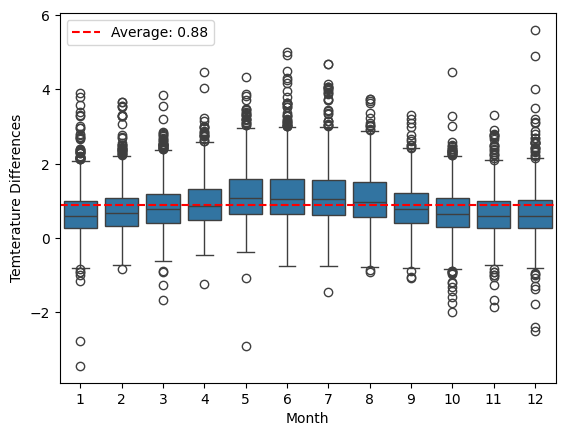

In [25]:
plt.figure()
graph = sns.boxplot(df_merged_temp_com, x=df_merged_temp_com['Month'], y=df_merged_temp_com['Diff'])
graph.axhline(avg_diff, color='r', linestyle='--', label=f'Average: {avg_diff.round(2)}')
graph.legend()
plt.ylabel('Temterature Differences')
plt.show()

In [26]:
df_merged_temp_com

,Datum,Kvalitet,Snittemperatur_GBG,Month,Quarter,Snittemperatur_save,Diff
0,1961-01-01,G,1.07,1,1,0.36,0.71
1,1961-01-02,G,2.27,1,1,1.64,0.63
2,1961-01-03,G,2.27,1,1,1.57,0.70
3,1961-01-04,G,2.53,1,1,1.38,1.15
4,1961-01-05,G,2.13,1,1,1.17,0.96
...,...,...,...,...,...,...,...
13887,2006-12-01,Y,8.35,12,4,8.03,0.32
13888,2006-12-02,Y,9.10,12,4,8.81,0.29
13889,2006-12-03,Y,8.50,12,4,8.11,0.39
13890,2006-12-04,Y,8.99,12,4,8.57,0.42


In [27]:
df_merged_temp_com['Monthly_diff'] = 0
for ind, val in df_merged_temp_com.iterrows():
    month_no = val['Month']
    df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)



C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\3339614065.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)
C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\3339614065.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.67' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)


In [28]:
df_merged_temp_com['Monthly_diff'].value_counts()

Monthly_diff
0.67    2330
1.16    2247
0.86    1202
1.06    1194
0.96    1185
0.70    1178
1.14    1172
0.82    1170
0.66    1140
0.76    1074
Name: count, dtype: int64

In [29]:
df_merged_temp_com[110:130]

,Datum,Kvalitet,Snittemperatur_GBG,Month,Quarter,Snittemperatur_save,Diff,Monthly_diff
110,1961-04-21,G,9.87,4,2,8.69,1.18,0.96
111,1961-04-22,G,13.53,4,2,12.36,1.17,0.96
112,1961-04-23,G,16.93,4,2,15.71,1.22,0.96
113,1961-04-24,G,16.73,4,2,15.44,1.29,0.96
114,1961-04-25,G,15.07,4,2,13.75,1.32,0.96
115,1961-04-26,G,15.40,4,2,14.64,0.76,0.96
116,1961-04-27,G,16.93,4,2,15.12,1.81,0.96
117,1961-04-28,G,13.57,4,2,11.69,1.88,0.96
118,1961-04-29,G,8.93,4,2,7.84,1.09,0.96
119,1961-04-30,G,10.47,4,2,10.15,0.32,0.96


In [30]:
df_all_temps = pd.read_csv('../data/Olof_Save_GBG_avg_daily_temp_data.csv', parse_dates=['Datum'])

In [31]:
df_all_temps

,Datum,Kvalitet,Snittemperatur,Year
0,1944-01-01,G,3.20,1944-01-01
1,1944-01-02,G,3.60,1944-01-01
2,1944-01-03,G,2.80,1944-01-01
3,1944-01-04,G,-4.47,1944-01-01
4,1944-01-05,G,-1.40,1944-01-01
...,...,...,...,...
29109,2023-10-12,G,12.08,2023-01-01
29110,2023-10-13,G,11.89,2023-01-01
29111,2023-10-14,G,11.54,2023-01-01
29112,2023-10-15,G,10.09,2023-01-01


In [32]:
df_all_temps['Month'] = df_all_temps['Datum'].dt.month
df_all_temps = df_all_temps.drop(columns=['Year'])
df_all_temps['Year'] = df_all_temps['Datum'].dt.year


In [33]:
df_all_temps

,Datum,Kvalitet,Snittemperatur,Month,Year
0,1944-01-01,G,3.20,1,1944
1,1944-01-02,G,3.60,1,1944
2,1944-01-03,G,2.80,1,1944
3,1944-01-04,G,-4.47,1,1944
4,1944-01-05,G,-1.40,1,1944
...,...,...,...,...,...
29109,2023-10-12,G,12.08,10,2023
29110,2023-10-13,G,11.89,10,2023
29111,2023-10-14,G,11.54,10,2023
29112,2023-10-15,G,10.09,10,2023


In [34]:
for ind, val in df_all_temps.iterrows():
    month = val['Month']
    # print(df_all_temps['Snittemperatur'])
    # print(temp_per_month[month])
    new_temp = df_all_temps['Snittemperatur'] + temp_per_month[month]
    print(new_temp)
    break

0         3.871044
1         4.271044
2         3.471044
3        -3.798956
4        -0.728956
           ...    
29109    12.751044
29110    12.561044
29111    12.211044
29112    10.761044
29113     4.941044
Name: Snittemperatur, Length: 29114, dtype: float64


In [35]:
df_all_temps_augmented = df_all_temps

In [36]:
date_to_start = pd.to_datetime('2006-12-06')
for ind, val in df_all_temps_augmented.iterrows():
    if val['Datum'] > date_to_start:
        month = val['Month']
        new_temp = val['Snittemperatur'] + temp_per_month[month]
        df_all_temps_augmented['Snittemperatur'][ind] = new_temp
    else:
        pass


C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\1994612176.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_temps_augmented['Snittemperatur'][ind] = new_temp
C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\1994612176.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_temps_augmented['Snittemperatur'][ind] = new_temp
C:\Users\olofs\AppData\Local\Temp\ipykernel_9588\1994612176.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versu

In [37]:
df_all_temps_augmented

,Datum,Kvalitet,Snittemperatur,Month,Year
0,1944-01-01,G,3.20000,1,1944
1,1944-01-02,G,3.60000,1,1944
2,1944-01-03,G,2.80000,1,1944
3,1944-01-04,G,-4.47000,1,1944
4,1944-01-05,G,-1.40000,1,1944
...,...,...,...,...,...
29109,2023-10-12,G,12.78101,10,2023
29110,2023-10-13,G,12.59101,10,2023
29111,2023-10-14,G,12.24101,10,2023
29112,2023-10-15,G,10.79101,10,2023


In [38]:
df_all_temps

,Datum,Kvalitet,Snittemperatur,Month,Year
0,1944-01-01,G,3.20000,1,1944
1,1944-01-02,G,3.60000,1,1944
2,1944-01-03,G,2.80000,1,1944
3,1944-01-04,G,-4.47000,1,1944
4,1944-01-05,G,-1.40000,1,1944
...,...,...,...,...,...
29109,2023-10-12,G,12.78101,10,2023
29110,2023-10-13,G,12.59101,10,2023
29111,2023-10-14,G,12.24101,10,2023
29112,2023-10-15,G,10.79101,10,2023


In [39]:
df_all_temps_augmented['Snittemperatur'] = df_all_temps_augmented['Snittemperatur'].round(2)

In [40]:
df_all_temps_augmented

,Datum,Kvalitet,Snittemperatur,Month,Year
0,1944-01-01,G,3.20,1,1944
1,1944-01-02,G,3.60,1,1944
2,1944-01-03,G,2.80,1,1944
3,1944-01-04,G,-4.47,1,1944
4,1944-01-05,G,-1.40,1,1944
...,...,...,...,...,...
29109,2023-10-12,G,12.78,10,2023
29110,2023-10-13,G,12.59,10,2023
29111,2023-10-14,G,12.24,10,2023
29112,2023-10-15,G,10.79,10,2023


In [41]:
df_all_temps_augmented['Day_of_year'] = df_all_temps_augmented['Datum'].dt.day_of_year

In [42]:
df_all_temps_augmented

,Datum,Kvalitet,Snittemperatur,Month,Year,Day_of_year
0,1944-01-01,G,3.20,1,1944,1
1,1944-01-02,G,3.60,1,1944,2
2,1944-01-03,G,2.80,1,1944,3
3,1944-01-04,G,-4.47,1,1944,4
4,1944-01-05,G,-1.40,1,1944,5
...,...,...,...,...,...,...
29109,2023-10-12,G,12.78,10,2023,285
29110,2023-10-13,G,12.59,10,2023,286
29111,2023-10-14,G,12.24,10,2023,287
29112,2023-10-15,G,10.79,10,2023,288


In [43]:
counter = 0
df_all_temps_augmented['Over_10_5_days_in_a_row'] = 0


In [44]:
df_all_temps_augmented[140:160]

,Datum,Kvalitet,Snittemperatur,Month,Year,Day_of_year,Over_10_5_days_in_a_row
140,1944-05-20,G,8.13,5,1944,141,0
141,1944-05-21,G,9.60,5,1944,142,0
142,1944-05-22,G,7.60,5,1944,143,0
143,1944-05-23,G,9.27,5,1944,144,0
144,1944-05-24,G,9.40,5,1944,145,0
145,1944-05-25,G,8.47,5,1944,146,0
146,1944-05-26,G,11.07,5,1944,147,0
147,1944-05-27,G,12.40,5,1944,148,0
148,1944-05-28,G,15.20,5,1944,149,0
149,1944-05-29,G,18.10,5,1944,150,0


In [ ]:
for i in range(1, len(df_all_temps)):
    if df_all_temps_augmented['Snittemperatur'].iloc[i] >= 10:
        counter += 1
    else:
        counter = 0
        pass
    if counter == 5:
        df_all_temps_augmented['Over_10_5_days_in_a_row'].iloc[i] = 1
        counter = 0
    else:
        pass


In [65]:
# df_all_temps_augmented.to_pickle('../Dataframes/daily_temp_gbg_save_adjusted.pkl')

In [47]:
def get_first_summer_day_per_year(year):
    for ind, val in df_all_temps_augmented[df_all_temps_augmented['Year'] == year].iterrows():
        if df_all_temps['Over_10_5_days_in_a_row'][ind] == 1:
            first_summer_day = df_all_temps_augmented['Datum'][ind-4]
            return first_summer_day
            break
        else:
            pass
    return None

In [48]:
def get_first_summer_day_per_year_non_augmented(year):
    for ind, val in df_all_temps[df_all_temps['Year'] == year].iterrows():
        if df_all_temps['Over_10_5_days_in_a_row'][ind] == 1:
            first_summer_day = df_all_temps['Datum'][ind-4]
            return first_summer_day
            break
        else:
            pass
    return None

In [49]:
get_first_summer_day_per_year_non_augmented(2018)

Timestamp('2018-05-04 00:00:00')

In [50]:
get_first_summer_day_per_year(2018)


Timestamp('2018-05-04 00:00:00')

In [51]:
summer_days = []
for i in range(1944, 2023):
    summer = pd.to_datetime(get_first_summer_day_per_year(i))
    summer_days.append(summer)


summer_days_non_augmented = []
for i in range(1944, 2023):
    summer = pd.to_datetime(get_first_summer_day_per_year_non_augmented(i))
    summer_days_non_augmented.append(summer)

In [52]:
summer_days_non_augmented[1]

Timestamp('1945-05-11 00:00:00')

In [53]:
years = []

for x, i in enumerate(summer_days):
    string = str(i.year)
    years.append(string)

months = []

for x, i in enumerate(summer_days):
    string = str(i.month)
    months.append(string)

days= []
for x, i in enumerate(summer_days):
    string = str(i.day)
    if len(string) < 2:
        string = f'0{string}'
    days.append(string)



years_non_augmented = []

for x, i in enumerate(summer_days_non_augmented):
    string = str(i.year)
    years_non_augmented.append(string)

months_non_augmented = []

for x, i in enumerate(summer_days_non_augmented):
    string = str(i.month)
    months_non_augmented.append(string)

days_non_augmented = []
for x, i in enumerate(summer_days_non_augmented):
    string = str(i.day)
    if len(string) < 2:
        string = f'0{string}'
    days_non_augmented.append(string)

In [54]:
df = pd.DataFrame({'Year': years, 'Month': months, 'Day': days})
df_non_augmented = pd.DataFrame({'Year': years_non_augmented , 'Month': months_non_augmented , 'Day': days_non_augmented })

In [55]:
df_non_augmented

,Year,Month,Day
0,1944,5,26
1,1945,5,11
2,1946,4,26
3,1947,5,04
4,1948,4,17
...,...,...,...
74,2018,5,04
75,2019,4,03
76,2020,4,20
77,2021,5,09


In [56]:
df['Day_of_year'] = f'{df["Month"]}{df["Day"]}'
df_non_augmented['Day_of_year'] = f'{df_non_augmented["Month"]}{df_non_augmented["Day"]}'

In [57]:
for ind, val in df.iterrows():
    mon = df['Month'][ind]
    day = df['Day'][ind]
    monday = str(f'{mon}{day}')
    df['Day_of_year'][ind] = summer_days[ind].day_of_year


for ind, val in df_non_augmented.iterrows():
    mon = df_non_augmented['Month'][ind]
    day = df_non_augmented['Day'][ind]
    monday = str(f'{mon}{day}')
    df_non_augmented['Day_of_year'][ind] = summer_days_non_augmented[ind].day_of_year

In [58]:
df_non_augmented

,Year,Month,Day,Day_of_year
0,1944,5,26,147
1,1945,5,11,131
2,1946,4,26,116
3,1947,5,04,124
4,1948,4,17,108
...,...,...,...,...
74,2018,5,04,124
75,2019,4,03,93
76,2020,4,20,111
77,2021,5,09,129


In [59]:
dates = [int(i) for i in df['Day_of_year']]
years = [int(i) for i in years]


dates_non_augmented = [int(i) for i in df_non_augmented['Day_of_year']]
yearslist_non_augmented = [int(i) for i in years_non_augmented]

In [60]:
first_day = datetime(1944, 1, 1)


iss = first_day+timedelta(days=99)
iss

datetime.datetime(1944, 4, 9, 0, 0)

In [61]:
ticlist = [100, 110, 120, 130, 140, 150, 160]

In [62]:
datelist = []
for i in ticlist:
    datenum = first_day+timedelta(days=i-1)
    month = datenum.strftime('%m')
    day = datenum.strftime('%d')
    datelist.append(f'{month}-{day}')

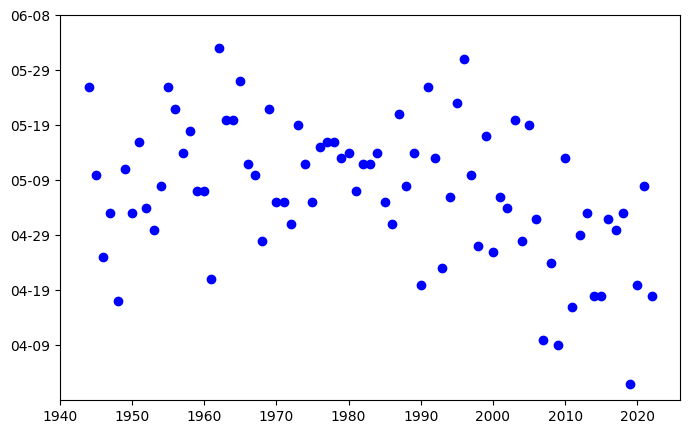

In [63]:


plt.figure(figsize=[8, 5])
sns.scatterplot(x=years, y=dates)
plt.scatter(x=years, y=dates, c='b')
plt.yticks(ticks=ticlist, labels=datelist)
plt.xticks(ticks=[1940, 1950, 1960, 1970, 1980, 1990, 2000, 2010, 2020])
plt.show()

testa med seaborn
